# Perception models

This tutorial demostrates how to use ZenSVI to access prediction models to predict Urban Visual Perception of your street view images for the following indicators:
- Safety
- Lively
- Wealthy
- Beautiful
- Boring
- Depressing

Currently two prediction models are available. Liang et al. prediciton model is based on a ResNet50 architecture and Ouyang's model is based on a Vision Transformer (ViT) archicture.

All values are float in the range of [0, 10].

**Acknowledgement**
Liang, X., Chang, J. H., Gao, S., Zhao, T. & Biljecki, F. (2024). Evaluating human perception of building exteriors using street view imagery. Building and Environment, 263, 111875. https://doi.org/10.1016/j.buildenv.2024.111875

Ouyang, J.: Code repository for predicting human perception (2023)

BibTex:
```bibtex

@article{Liang.2024, 
    year = {2024}, 
    title = {{Evaluating human perception of building exteriors using street view imagery}}, 
    author = {Liang, Xiucheng and Chang, Jiat Hwee and Gao, Song and Zhao, Tianhong and Biljecki, Filip}, 
    journal = {Building and Environment}, 
    issn = {0360-1323}, 
    doi = {10.1016/j.buildenv.2024.111875}, 
    pages = {111875}, 
    volume = {263}, 
}

@article{Ouyang.2023,
    author = {Ouyang, Jiani},
    title ={Code repository for predicting human perception},
    year = {2023},
    url = {https://github.com/strawmelon11/human-perception-place-pulse},
}

```

## Download sample images

In [1]:
from huggingface_hub import HfApi, hf_hub_download
import os

def download_folder(repo_id, repo_type, folder_path, local_dir):
    """
    Download an entire folder from a huggingface dataset repository.
    repo_id : string
        The ID of the repository (e.g., 'username/repo_name').
    repo_type : string
        Type of the repo, dataset or model.
    folder_path : string
        The path to the folder within the repository.
    local_dir : string
        Local folder to download the data. This mimics git behaviour
    """
    api = HfApi()
    # list all files in the repo, keep the ones within folder_path
    all_files = api.list_repo_files(repo_id, repo_type=repo_type)
    files_list = [f for f in all_files if f.startswith(folder_path)]

    # download each of those files
    for file_path in files_list:
        hf_hub_download(repo_id=repo_id, repo_type=repo_type,
                        filename=file_path, local_dir=local_dir)


# Download entire data/ folder
repo_id = "NUS-UAL/zensvi_test_data" # you can replace this for other huggingface repos
repo_type = "dataset" # required by the API when the repo is a dataset
folder_path = "input/visualization/batch_images/batch_1" # replace the folder you want within the repo 
local_dir = "./demo_data" # the local folder in your computer where it will be downloaded
if not os.path.exists(local_dir):
    os.makedirs(local_dir)

# By default, huggingface download them to the .cache/huggingface folder
download_folder(repo_id, repo_type, folder_path, local_dir)

/Users/mquintana/miniforge3/envs/zensvi_311/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


# Classification

In [2]:
from pathlib import Path

from zensvi.cv import ClassifierPerception
from zensvi.cv import ClassifierPerceptionViT
from zensvi.cv.classification.utils.Model_01 import Net

In [3]:
indicator = 'more boring'
dir_summary_output_1 = str(Path(local_dir) / "directory/summary_Liang")
dir_summary_output_2 = str(Path(local_dir) / "directory/summary_Ouyang")
input_folder = str(Path(local_dir) / folder_path)

## Entire folder

In [4]:
# model by Liang et al
classifier = ClassifierPerception(perception_study = indicator)
classifier.classify(
    input_folder,
    dir_summary_output=dir_summary_output_1,
    batch_size=3,
)

Using CPU
Using CPU


/Users/mquintana/Developer/forked__zensvi/src/zensvi/cv/classification/perception.py:134: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(checkpoint_pa

[{'filename_key': '1158297185027486', 'more boring': 3.4220707416534424},
 {'filename_key': '851588095803411', 'more boring': 4.156600475311279},
 {'filename_key': '3078044802482414', 'more boring': 4.460619926452637},
 {'filename_key': '600711734231518', 'more boring': 5.521065711975098},
 {'filename_key': '515077153491310', 'more boring': 4.191150188446045},
 {'filename_key': '5321359991242907', 'more boring': 4.283115386962891},
 {'filename_key': '494572955764175', 'more boring': 4.368640899658203},
 {'filename_key': '986257745381645', 'more boring': 4.948808670043945},
 {'filename_key': '1160171564566431', 'more boring': 4.737444877624512},
 {'filename_key': '384683626988506', 'more boring': 3.701953649520874},
 {'filename_key': '628231478575219', 'more boring': 3.6941511631011963},
 {'filename_key': '1455202961590851', 'more boring': 3.9634287357330322},
 {'filename_key': '1201847686924949', 'more boring': 6.514774322509766},
 {'filename_key': '285790924047947', 'more boring': 3.4

In [5]:
# model by Ouyang
classifier = ClassifierPerceptionViT(perception_study = indicator)
classifier.classify(
            input_folder,
            dir_summary_output=dir_summary_output_2,
            batch_size=3,
)

Using CPU
Using CPU


Fetching 2 files: 100%|███████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 1800.13it/s]
/Users/mquintana/Developer/forked__zensvi/src/zensvi/cv/classification/perception.py:283: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control 

[{'filename_key': '1158297185027486', 'more boring': 0.949999988079071},
 {'filename_key': '851588095803411', 'more boring': 3.609999895095825},
 {'filename_key': '3078044802482414', 'more boring': 5.889999866485596},
 {'filename_key': '600711734231518', 'more boring': 3.0399999618530273},
 {'filename_key': '515077153491310', 'more boring': 4.71999979019165},
 {'filename_key': '5321359991242907', 'more boring': 1.6399999856948853},
 {'filename_key': '494572955764175', 'more boring': 2.5399999618530273},
 {'filename_key': '986257745381645', 'more boring': 3.640000104904175},
 {'filename_key': '1160171564566431', 'more boring': 1.5399999618530273},
 {'filename_key': '384683626988506', 'more boring': 7.619999885559082},
 {'filename_key': '628231478575219', 'more boring': 2.75},
 {'filename_key': '1455202961590851', 'more boring': 1.2100000381469727},
 {'filename_key': '1201847686924949', 'more boring': 2.4200000762939453},
 {'filename_key': '285790924047947', 'more boring': 4.389999866485

## One image

In [6]:
# model by Liang et al
image_input = str(Path(input_folder) / "1060932214587523.png")
dir_summary_output = str(Path(local_dir) / "single/summary_Liang")
classifier = ClassifierPerception(perception_study = indicator)

classifier.classify(
    image_input,
    dir_summary_output=dir_summary_output,
)

Using CPU
Using CPU


/Users/mquintana/Developer/forked__zensvi/src/zensvi/cv/classification/perception.py:134: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(checkpoint_pa

[{'filename_key': '1060932214587523', 'more boring': 4.13783073425293}]

# Examine output

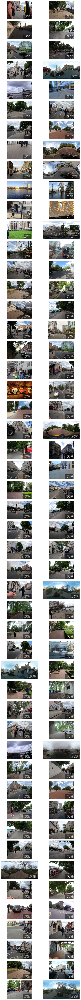

In [16]:
import os
import math
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image

# Set the paths
output_folder_1 = dir_summary_output_1
output_folder_2 = dir_summary_output_2
indicator = 'more boring'

# Load results
results1_df = pd.read_csv(f'{output_folder_1}/results.csv')
results2_df = pd.read_csv(f'{output_folder_2}/results.csv')

image_ids = results1_df['filename_key']
# Number of rows and columns for the grid
cols = 2
rows = math.ceil(len(image_ids) / cols)

# Create a figure with subplots
fig, axes = plt.subplots(rows, cols, figsize=(10, 100))  # Adjust figsize as needed
axes = axes.flatten()  # Flatten axes for easier indexing

# Sort image IDs to ensure consistent ordering
sorted_image_ids = sorted(image_ids)

# Iterate through each unique image ID
for i, img_uuid in enumerate(sorted_image_ids):  # Limit to available images
    img_path = os.path.join(input_folder, f"{img_uuid}.png")  # Adjust if necessary

    if os.path.exists(img_path):  # Check if image exists
        img = Image.open(img_path)

        # Display the image
        axes[i].imshow(img)
        axes[i].axis('off')  # Hide axes for the image

        # Prepare to display classification outcomes
        results_1 = results1_df[results1_df['filename_key'] == img_uuid][indicator].values[0]
        text_1 = f'{round(results_1, 2)} - Liang'
        
        results_2 = results2_df[results2_df['filename_key'] == img_uuid][indicator].values[0]
        text_2 = f'{round(results_2, 2)} - Ouyang'
        
        outcome_text = indicator + "\n" + text_1 + "\n" + text_2

        # Overlay the classification outcomes at the bottom right corner of the image
        axes[i].text(0.95, 0.05, outcome_text, fontsize=7, ha='right', va='bottom', 
                     color='white', bbox=dict(facecolor='black', alpha=0.5), transform=axes[i].transAxes)  # Add a semi-transparent background for better readability
    else:
        print(f"Image for UUID {img_uuid} not found.")

# Adjust layout and remove empty subplots
for j in range(len(sorted_image_ids), rows * cols):
    axes[j].axis('off')  # Hide any unused axes

plt.tight_layout()
plt.show()

From the above we can see that there are instances where both models agreed on similar scores and other where they differ.
Each model has reported their own accuracies in their respective works and, although they are similar, discrepancies can be observed here.
The ZenSVI package supports both models for benchmarking purposes and the development team encourage the submission of new models to contribute to this field.